#  **멀티모달(multi-modal) 학습** 

- **멀티모달 학습**은 텍스트, 이미지, 오디오 등 **다양한 데이터 형식**을 동시에 처리하는 혁신적인 AI 접근 방식

    - 텍스트: 자연어 문장, 문서, 메타데이터
    - 이미지: 사진, 그래프, 차트, 다이어그램
    - 오디오: 음성, 음악, 환경음
    - 비디오: 동영상 시퀀스
    - 센서 데이터: IoT 센서, 생체신호 등

- 인간의 감각 통합 방식과 유사하게 여러 정보 채널을 **동시에 학습**하여 더 깊은 맥락적 이해 제공

- **모달리티별 특화된 신경망** 아키텍처를 사용하여 각 데이터 유형의 고유한 특징을 효과적으로 추출

    - **텍스트 모달리티**: **BERT, GPT** 등의 언어 모델을 활용하여 문맥적 이해와 의미 표현 학습
    - **이미지 모달리티**: **CNN, Vision Transformer**를 통해 시각적 특징 및 패턴 추출
    - **오디오 모달리티**: **웨이브넷, Mel-스펙트로그램** 기반 모델로 음향학적 특성 분석


- 멀티 모달리티 **특징 융합 방법**

    - **Early Fusion**: 입력 단계에서 모달리티 특징을 **직접 결합**하는 방식

    - **Late Fusion**: 각 모달리티를 **개별적으로 처리** 후 최종 결과 통합

    - **Hybrid Fusion**: **다단계 특징 결합**을 통한 유연하고 복합적인 모달리티 통합 접근법

---

`(1) Env 환경변수`

In [10]:
from dotenv import load_dotenv
load_dotenv()

# HuggingFace 인증 (모델 다운로드를 위해 필요)
import os
from huggingface_hub import login

hf_token = os.getenv('HF_TOKEN')
if hf_token:
    try:
        login(token=hf_token)
        print("✅ HuggingFace 인증 성공!")
    except Exception as e:
        print(f"⚠️ HuggingFace 인증 실패: {e}")
else:
    print("⚠️ HF_TOKEN 환경 변수가 설정되지 않았습니다.")

Note: Environment variable`HF_TOKEN` is set and is the current active token independently from the token you've just configured.


✅ HuggingFace 인증 성공!


`(2) 기본 라이브러리`

In [11]:
import os
from glob import glob

from pprint import pprint
import json

import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings('ignore')

---

## **이미지-텍스트 임베딩 기술**

- **이미지-텍스트 임베딩**의 핵심은 서로 다른 모달리티 데이터를 **공통 벡터 공간에 투영**하는 기술

- 모달리티 간 **의미적 유사성을 벡터로 표현**하여 cross-modal 이해와 분석 가능

- **CLIP 모델**은 이미지와 텍스트를 **의미론적으로 연결**하는 혁신적인 접근 방식 제시

    - OpenAI의 **12명의 연구진**이 개발했으며, 이미지-텍스트 쌍으로 사전 학습
    
    - GPT 모델과 유사하게 **제로샷 학습** 능력을 보유하여 새로운 작업에 빠르게 적용 가능

    - 특정 작업에 대한 **추가 학습 없이** 자연어 기반의 이미지 분석이 가능

    - 논문: https://arxiv.org/abs/2103.00020

### **OpenClip** 소개

- OpenClip은 OpenAI의 CLIP(Contrastive Language-Image Pre-training)을 오픈소스로 구현한 라이브러리

    - 이미지와 텍스트 간의 의미적 유사성 계산
    - 다양한 크기와 성능의 모델 지원
    - 이미지 검색, 분류, 설명 생성 등 다양한 응용 가능

### 1. **필요 라이브러리 설치 및 임포트** 

- 필요한 라이브러리 설치 

- pip install --upgrade --quiet langchain-experimental
- pip install --upgrade --quiet pillow open_clip_torch torch matplotlib

- https://python.langchain.com/docs/integrations/text_embedding/open_clip/

In [12]:
# 이미지 처리를 위한 라이브러리 임포트
import numpy as np
import os
import requests
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO
import torch
import open_clip
from langchain_experimental.open_clip import OpenCLIPEmbeddings

# 파이토치 버전 확인
print(torch.__version__)

2.9.0+cpu


### 2. **CLIP 임베딩 모델 로드** 


In [13]:
# 사용 가능한 모델 확인
def check_available_models():
    models = open_clip.list_pretrained()
    print("사용 가능한 모델 목록:")
    for model in models:
        print(f"- {model}")


check_available_models()

사용 가능한 모델 목록:
- ('RN50', 'openai')
- ('RN50', 'yfcc15m')
- ('RN50', 'cc12m')
- ('RN101', 'openai')
- ('RN101', 'yfcc15m')
- ('RN50x4', 'openai')
- ('RN50x16', 'openai')
- ('RN50x64', 'openai')
- ('ViT-B-32', 'openai')
- ('ViT-B-32', 'laion400m_e31')
- ('ViT-B-32', 'laion400m_e32')
- ('ViT-B-32', 'laion2b_e16')
- ('ViT-B-32', 'laion2b_s34b_b79k')
- ('ViT-B-32', 'datacomp_xl_s13b_b90k')
- ('ViT-B-32', 'datacomp_m_s128m_b4k')
- ('ViT-B-32', 'commonpool_m_clip_s128m_b4k')
- ('ViT-B-32', 'commonpool_m_laion_s128m_b4k')
- ('ViT-B-32', 'commonpool_m_image_s128m_b4k')
- ('ViT-B-32', 'commonpool_m_text_s128m_b4k')
- ('ViT-B-32', 'commonpool_m_basic_s128m_b4k')
- ('ViT-B-32', 'commonpool_m_s128m_b4k')
- ('ViT-B-32', 'datacomp_s_s13m_b4k')
- ('ViT-B-32', 'commonpool_s_clip_s13m_b4k')
- ('ViT-B-32', 'commonpool_s_laion_s13m_b4k')
- ('ViT-B-32', 'commonpool_s_image_s13m_b4k')
- ('ViT-B-32', 'commonpool_s_text_s13m_b4k')
- ('ViT-B-32', 'commonpool_s_basic_s13m_b4k')
- ('ViT-B-32', 'commonpool_s_s13m

In [14]:
"""
# 사전 학습된 CLIP 모델 로드
# Note: "openai" checkpoint는 인증이 필요하므로 "metaclip_400m"을 사용합니다

clip_embd_model = OpenCLIPEmbeddings(model_name="ViT-B-16-quickgelu", checkpoint="metaclip_400m")

clip_embd_model
"""

from huggingface_hub import snapshot_download

snapshot_download(
    repo_id="timm/vit_base_patch16_clip_224.metaclip_400m",
    local_dir="./models/metaclip_400m",
    local_dir_use_symlinks=False
)




Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

'F:\\대학과제\\25-하반기\\8_모연_재직자_LLM\\PRJ_04\\Week2_20251118_20251122\\models\\metaclip_400m'

In [15]:
clip_embd_model = OpenCLIPEmbeddings(
    model_name="ViT-B-16-quickgelu", 
    checkpoint="./models/metaclip_400m/open_clip_pytorch_model.bin"
)

### 3. **이미지 및 텍스트 임베딩 생성** 

In [16]:
import urllib

# 샘플 이미지 다운로드
urls = [
    "http://images.cocodataset.org/val2017/000000000285.jpg",  # bear
    "http://images.cocodataset.org/val2017/000000039769.jpg",  # cats
    "http://images.cocodataset.org/val2017/000000000776.jpg",  # Teddy bears

]

# 이미지와 비교할 텍스트 쿼리 또는 이미지에 대한 설명 텍스트
texts = ["bear", "cats", "Teddy bears"]  

for url, text in zip(urls, texts):
    fname = text.replace(" ", "_").lower()
    urllib.request.urlretrieve(url, f"{fname}.jpg")


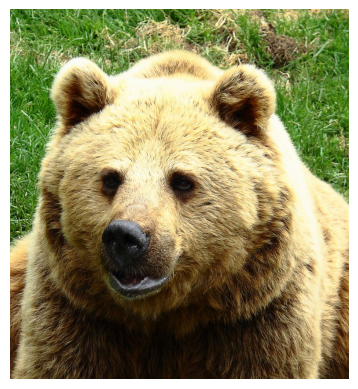

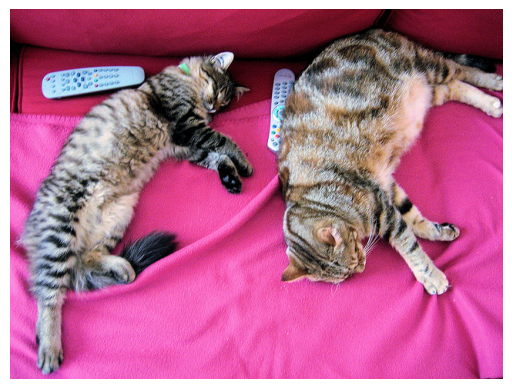

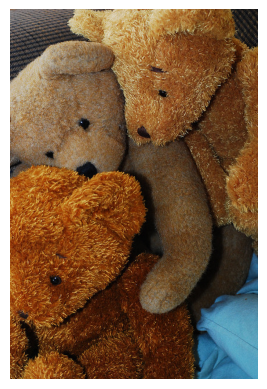

In [17]:
# 이미지 출력
def show_image(image_path):
    image = Image.open(image_path)
    plt.imshow(image)
    plt.axis('off')
    plt.show()

# 이미지 경로
image_paths = [f"{text.replace(' ', '_').lower()}.jpg" for text in texts]

# 이미지 출력
for image_path in image_paths:
    show_image(image_path)

In [18]:
# 이미지와 텍스트 임베딩 생성
img_features = clip_embd_model.embed_image(image_paths)
text_features = clip_embd_model.embed_documents(texts)

# 임베딩을 NumPy 배열로 변환
img_features_np = np.array(img_features)
text_features_np = np.array(text_features)

# 배열의 모양 확인
print("Image features shape:", img_features_np.shape)
print("Text features shape:", text_features_np.shape)

Image features shape: (3, 512)
Text features shape: (3, 512)


Text(0.5, 1.0, 'Cosine Similiarity')

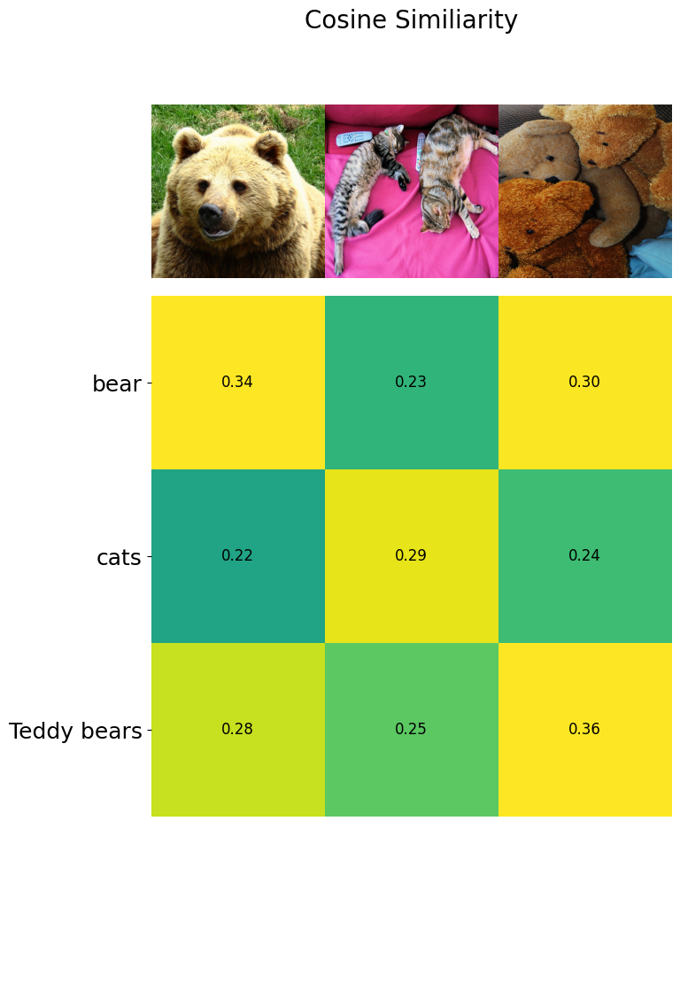

In [19]:
# 이미지-텍스트 유사도 계산 및 시각화
similarity = np.matmul(text_features_np, img_features_np.T)

# 결과 시각화
count = len(texts)
plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])

# 이미지 표시
for i, image in enumerate([Image.open(image_path) for image_path in image_paths]):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")

# 유사도 점수 표시
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

# 그래프 테두리 제거
for side in ["left", "top", "right", "bottom"]:
    plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])
plt.title("Cosine Similiarity", size=20)

---

## **UNSPLASH 데이터셋을 활용한 이미지 검색**

- **Faiss** 라이브러리를 활용하여 **대규모 이미지 검색**을 구현

- Faiss **인덱스**를 파일로 저장하고 필요할 때 로드하는 방식으로 메모리를 관리

- **유사도 검색** 알고리즘으로 대규모 데이터셋에서도 빠른 검색이 가능

### 1. **필요 라이브러리 설치** 

- faiss-cpu 설치 (GPU 사용 시 faiss-gpu 설치)
- pip install faiss-cpu sentence-transformers 

In [20]:
import os
import zipfile
from tqdm.autonotebook import tqdm
from PIL import Image
import requests
import torch
import numpy as np
import faiss 
import pickle
from IPython.display import display
from sentence_transformers import util

### 2. **UNSPLASH 이미지 데이터셋 준비** 

In [21]:
from glob import glob

# 이미지 다운로드 
img_folder = 'unsplash/'
if not os.path.exists(img_folder) or len(os.listdir(img_folder)) == 0:
    os.makedirs(img_folder, exist_ok=True)
    photo_filename = 'unsplash-25k-photos.zip'
    if not os.path.exists(photo_filename):
        util.http_get('http://sbert.net/datasets/'+photo_filename, photo_filename) # sentence-transformers util 사용
    with zipfile.ZipFile(photo_filename, 'r') as zf:
        for member in tqdm(zf.infolist(), desc='Extracting'):
            zf.extract(member, img_folder)

# 이미지 파일 경로 리스트 생성
img_files = glob(os.path.join(img_folder, '*.jpg'))

# 이미지 파일 경로 리스트 확인
print(f'이미지 파일 개수: {len(img_files)}')
print(img_files[:5])

이미지 파일 개수: 24996
['unsplash\\--2IBUMom1I.jpg', 'unsplash\\--6JlGcHl-w.jpg', 'unsplash\\--e3kJUMSZw.jpg', 'unsplash\\--Jy_8mvs4E.jpg', 'unsplash\\--kGuWTwn48.jpg']


### 3. **FAISS 인덱스에 임베딩 저장** 

In [22]:
# 이미 다운로드한 로컬 모델 사용
checkpoint_path = "./models/metaclip_400m/open_clip_pytorch_model.bin"

# GPU 사용 설정
device = "cuda" if torch.cuda.is_available() else "cpu"

# 로컬 체크포인트에서 모델 로드
model, _, preprocess = open_clip.create_model_and_transforms(
    'ViT-B-16-quickgelu', 
    pretrained=checkpoint_path,  # 로컬 경로 사용
    device=device
)
model.eval()

print(f"✅ 모델 로드 완료: {device}")

✅ 모델 로드 완료: cpu


In [23]:
import torch
import open_clip
from PIL import Image
import numpy as np
from tqdm import tqdm

# ===== 기존 코드: OpenCLIPEmbeddings 로드 대체 =====
# clip_embd_model = OpenCLIPEmbeddings(model_name="ViT-B-16-quickgelu", checkpoint="metaclip_400m")

# GPU 사용 설정
device = "cuda" if torch.cuda.is_available() else "cpu"

# 로컬 체크포인트에서 모델 로드
model, _, preprocess = open_clip.create_model_and_transforms(
    'ViT-B-16-quickgelu',
    pretrained=checkpoint_path,  # 로컬 경로 사용
    device=device
)
model.eval()

print(f"모델 로드 완료: {device}")

# ===== 기존 코드와 동일한 구조 유지 =====
# 이미지 폴더에서 이미지를 불러와서 임베딩을 계산하고 FAISS에 저장 
# 테스트를 위해 1000개의 이미지만 사용하는 것으로 수정
img_files = img_files[:1000]

# 이미지 임베딩 계산 - batch 처리
img_embeddings = []
batch_size = 64

for i in tqdm(range(0, len(img_files), batch_size), desc='Calculating Image Embeddings'):
    batch_files = img_files[i:i+batch_size]
    
    # 배치 이미지 로드 및 전처리
    batch_images = []
    for img_path in batch_files:
        try:
            img = Image.open(img_path).convert('RGB')
            batch_images.append(preprocess(img))
        except Exception as e:
            print(f"이미지 로드 실패 {img_path}: {e}")
            # 실패한 이미지는 건너뛰기
            continue
    
    if len(batch_images) == 0:
        continue
    
    # 배치 텐서로 변환 및 GPU로 이동
    batch_tensor = torch.stack(batch_images).to(device)
    
    # 임베딩 계산 (기존 embed_image 메서드와 동일한 기능)
    with torch.no_grad(), torch.cuda.amp.autocast():
        image_features = model.encode_image(batch_tensor)
        # 정규화 (OpenCLIP 표준)
        image_features = image_features / image_features.norm(dim=-1, keepdim=True)
    
    # NumPy로 변환하여 저장
    batch_embeddings = image_features.cpu().numpy()
    img_embeddings.append(batch_embeddings)

# 이미지 임베딩을 NumPy 배열로 변환
img_embeddings = np.vstack(img_embeddings)

# 이미지 임베딩의 크기 확인
print(f'Image Embeddings Shape: {img_embeddings.shape}')


모델 로드 완료: cpu


Calculating Image Embeddings: 100%|██████████| 16/16 [02:00<00:00,  7.55s/it]

Image Embeddings Shape: (1000, 512)


In [24]:
# FAISS 인덱스 생성
index = faiss.IndexFlatL2(img_embeddings.shape[1])
index.add(img_embeddings)  # 이미지 임베딩 추가

# FAISS 인덱스 저장
faiss.write_index(index, 'img_embeddings.index')

In [25]:
# FAISS 인덱스 로드
index = faiss.read_index('img_embeddings.index')

# FAISS 인덱스 확인
print(f"FAISS index: {index}")

FAISS index: <faiss.swigfaiss_avx2.IndexFlatL2; proxy of <Swig Object of type 'faiss::IndexFlatL2 *' at 0x000001F7920888A0> >


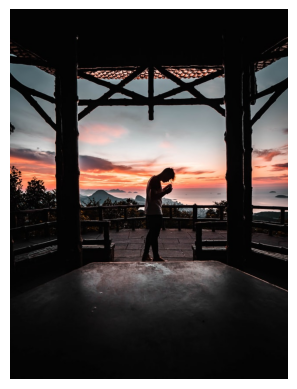

In [26]:
# FAISS 인덱스에서 가장 가까운 k개의 이웃 검색
def search_similar_images(query_image_path, k):
    # 이미지 로드 및 전처리
    query_img = Image.open(query_image_path).convert('RGB')
    query_tensor = preprocess(query_img).unsqueeze(0).to(device)
    
    # 이미지 임베딩 생성
    with torch.no_grad(), torch.cuda.amp.autocast():
        query_embedding = model.encode_image(query_tensor)
        # 정규화
        query_embedding = query_embedding / query_embedding.norm(dim=-1, keepdim=True)
    
    # NumPy 배열로 변환
    query_embedding = query_embedding.cpu().numpy().astype(np.float32)
    
    # FAISS 인덱스에서 가장 가까운 k개의 이웃 검색
    distances, indices = index.search(query_embedding, k)
    
    # 결과 반환
    return distances[0], indices[0]


# 쿼리 이미지 경로
query_image_path = img_files[0]  # 첫 번째 이미지 사용

# 쿼리 이미지 출력
show_image(query_image_path)

유사한 이미지 1: unsplash\--2IBUMom1I.jpg (거리: 0.0000)


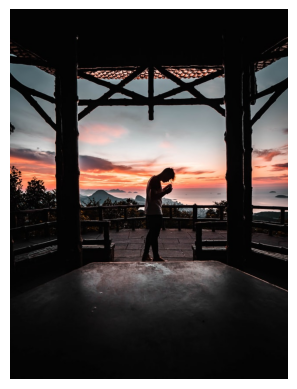

유사한 이미지 2: unsplash\-WCcU89aBe0.jpg (거리: 0.4342)


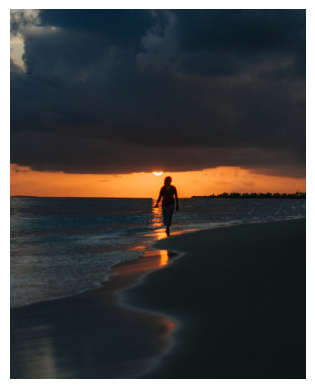

유사한 이미지 3: unsplash\0Jt5a_HB5kM.jpg (거리: 0.4600)


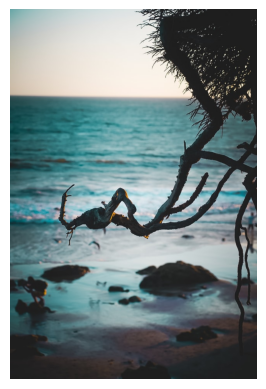

유사한 이미지 4: unsplash\007R8JewpwU.jpg (거리: 0.4616)


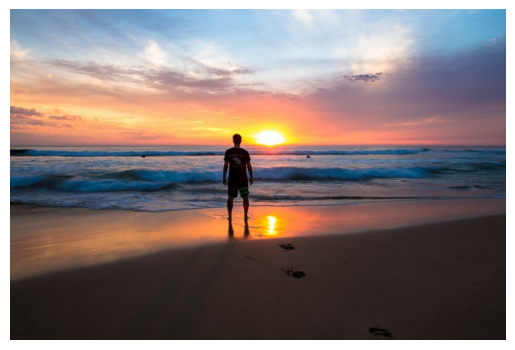

유사한 이미지 5: unsplash\0HzReGi-sRc.jpg (거리: 0.4679)


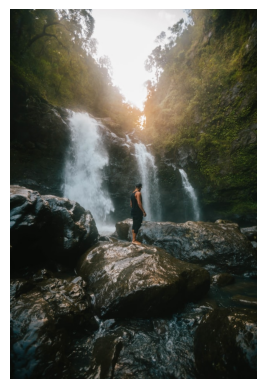

In [27]:
# 유사한 이미지 검색
distances, indices = search_similar_images(query_image_path, k=5)

# 유사한 이미지 출력
for i, idx in enumerate(indices):
    print(f"유사한 이미지 {i+1}: {img_files[idx]} (거리: {distances[i]:.4f})")
    show_image(img_files[idx])

텍스트 쿼리: a black dog running in the park
유사한 이미지 1: unsplash\09iA8GzINiI.jpg (거리: 1.3306)


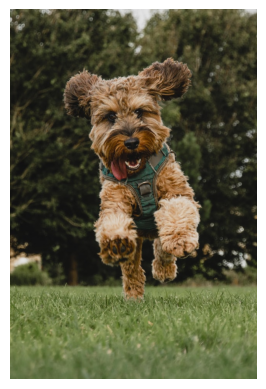

유사한 이미지 2: unsplash\0-mijZQHh9g.jpg (거리: 1.3900)


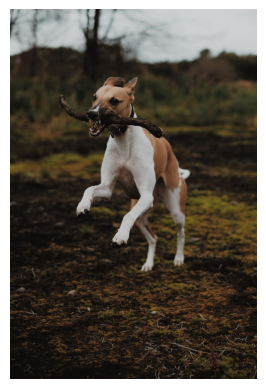

유사한 이미지 3: unsplash\1mP62BB2xcI.jpg (거리: 1.3946)


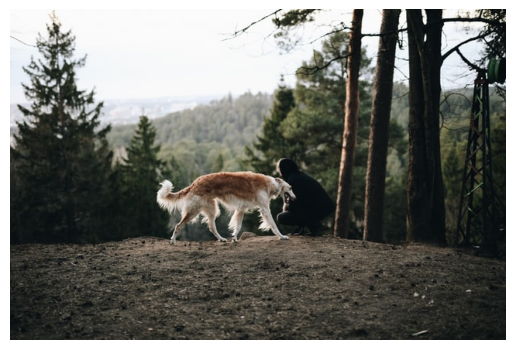

유사한 이미지 4: unsplash\-iMFAn0IRPs.jpg (거리: 1.3975)


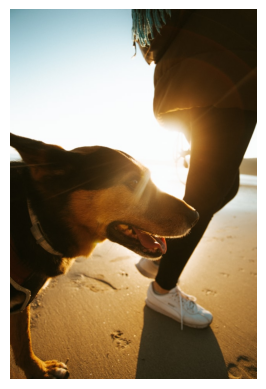

유사한 이미지 5: unsplash\0ARZS-6Q5OA.jpg (거리: 1.4074)


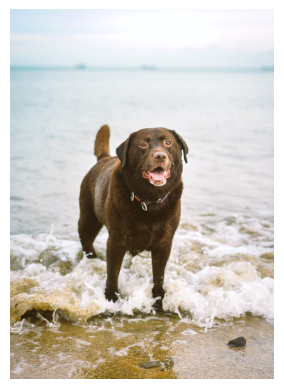

텍스트 쿼리: 공원에서 달리는 검은 개
유사한 이미지 1: unsplash\-DKUThtgWI0.jpg (거리: 1.4297)


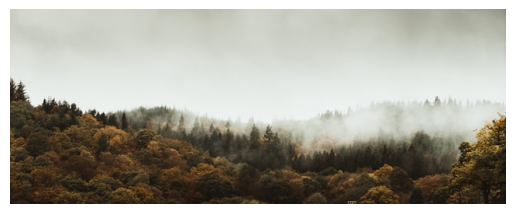

유사한 이미지 2: unsplash\-_g2m_6PzQk.jpg (거리: 1.4478)


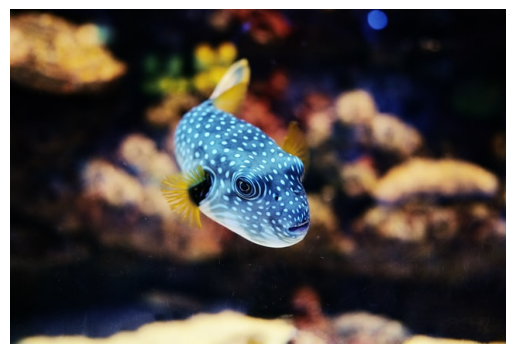

유사한 이미지 3: unsplash\-bAy8jTPWVo.jpg (거리: 1.4558)


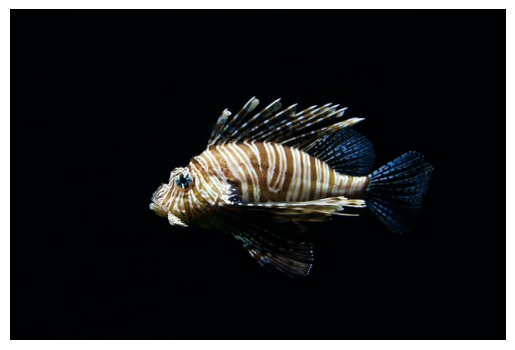

유사한 이미지 4: unsplash\1DljuMaWA9g.jpg (거리: 1.4563)


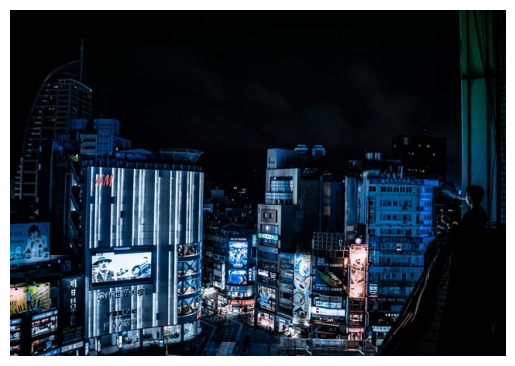

유사한 이미지 5: unsplash\0uN9iF4mgDI.jpg (거리: 1.4576)


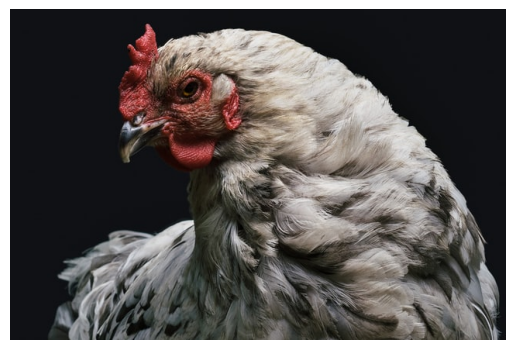

In [28]:
# 텍스트 쿼리 임베딩 생성
text_queries = [
    "a black dog running in the park",
    "공원에서 달리는 검은 개",
]

# FAISS 인덱스에서 가장 가까운 k개의 이웃 검색
def search_similar_images_by_text(text_query, k):
    # 텍스트 토큰화
    text_tokens = open_clip.tokenize([text_query]).to(device)
    
    # 텍스트 임베딩 생성
    with torch.no_grad(), torch.cuda.amp.autocast():
        text_embedding = model.encode_text(text_tokens)
        # 정규화
        text_embedding = text_embedding / text_embedding.norm(dim=-1, keepdim=True)
    
    # NumPy 배열로 변환
    text_embedding = text_embedding.cpu().numpy().astype(np.float32)
    
    # FAISS 인덱스에서 가장 가까운 k개의 이웃 검색
    distances, indices = index.search(text_embedding, k)
    
    # 결과 반환
    return distances[0], indices[0]


# 텍스트 쿼리 이미지 검색
for text_query in text_queries:
    print(f"텍스트 쿼리: {text_query}")
    
    # 유사한 이미지 검색
    distances, indices = search_similar_images_by_text(text_query, k=5)
    
    # 유사한 이미지 출력
    for i, idx in enumerate(indices):
        print(f"유사한 이미지 {i+1}: {img_files[idx]} (거리: {distances[i]:.4f})")
        show_image(img_files[idx])

---
## [실습] 

- 다른 텍스트를 이용해서 이미지를 검색하고, 그 결과를 분석하세요. 



다양한 텍스트 쿼리를 사용한 이미지 검색 실습

📝 텍스트 쿼리: a beautiful sunset over the ocean

유사한 이미지 1: unsplash\0rPV2_Wr-JE.jpg
거리(낮을수록 유사): 1.2988


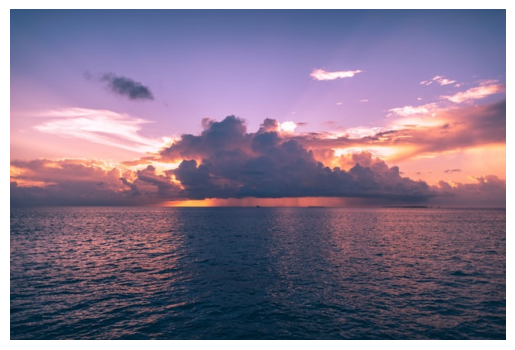


유사한 이미지 2: unsplash\0KoRn8IQFww.jpg
거리(낮을수록 유사): 1.3003


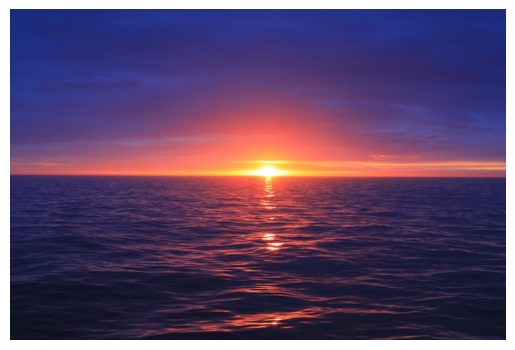


유사한 이미지 3: unsplash\-95yF3Q4l8s.jpg
거리(낮을수록 유사): 1.3136


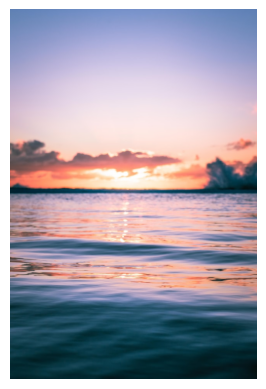


📝 텍스트 쿼리: 바다 위의 아름다운 일몰

유사한 이미지 1: unsplash\-3IZERJGsm4.jpg
거리(낮을수록 유사): 1.4191


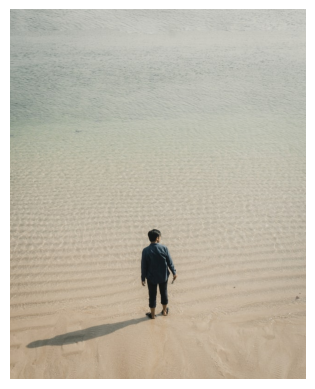


유사한 이미지 2: unsplash\-mESfCrs84c.jpg
거리(낮을수록 유사): 1.4226


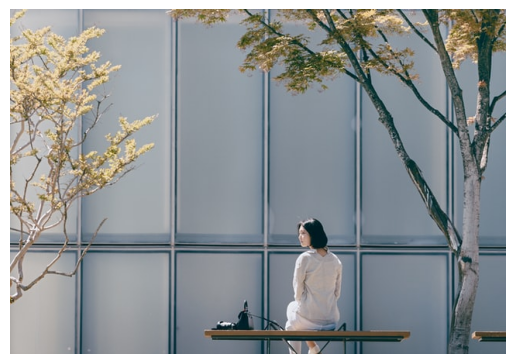


유사한 이미지 3: unsplash\0hDR599-5I0.jpg
거리(낮을수록 유사): 1.4240


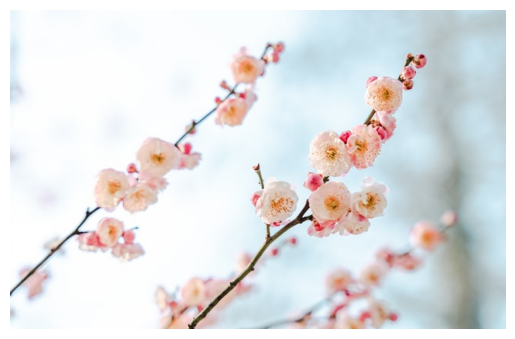


📝 텍스트 쿼리: a person riding a bicycle

유사한 이미지 1: unsplash\0grrJP6jPDg.jpg
거리(낮을수록 유사): 1.4153


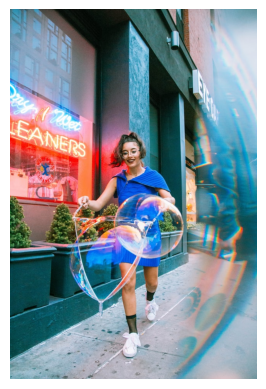


유사한 이미지 2: unsplash\-jXsYZeA7tQ.jpg
거리(낮을수록 유사): 1.4247


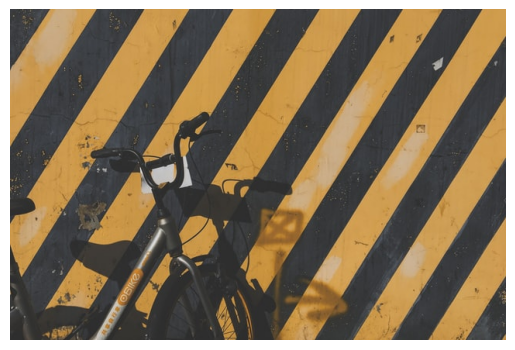


유사한 이미지 3: unsplash\-QVXoX2Lxjo.jpg
거리(낮을수록 유사): 1.4334


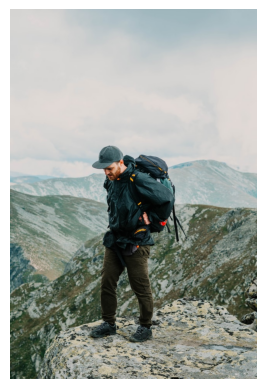


📝 텍스트 쿼리: 자전거를 타는 사람

유사한 이미지 1: unsplash\0u_VMSWGgBU.jpg
거리(낮을수록 유사): 1.4074


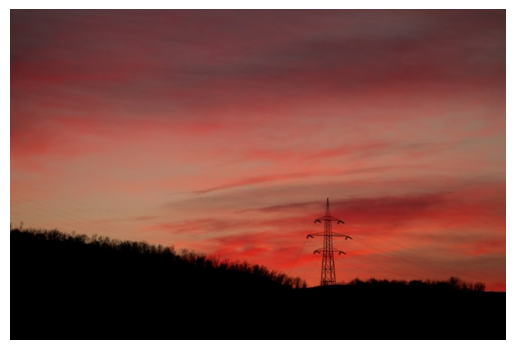


유사한 이미지 2: unsplash\-aptt8SCOHI.jpg
거리(낮을수록 유사): 1.4086


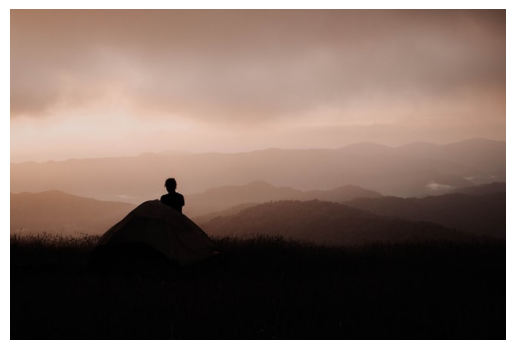


유사한 이미지 3: unsplash\0kxebH7U7xg.jpg
거리(낮을수록 유사): 1.4125


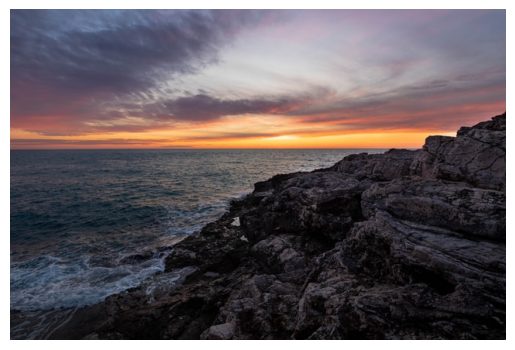


📝 텍스트 쿼리: colorful flowers in a garden

유사한 이미지 1: unsplash\-mxbFhmev4o.jpg
거리(낮을수록 유사): 1.3913


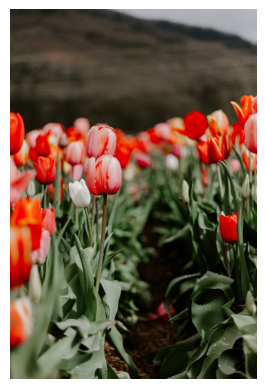


유사한 이미지 2: unsplash\0zDRkxHyaCA.jpg
거리(낮을수록 유사): 1.3991


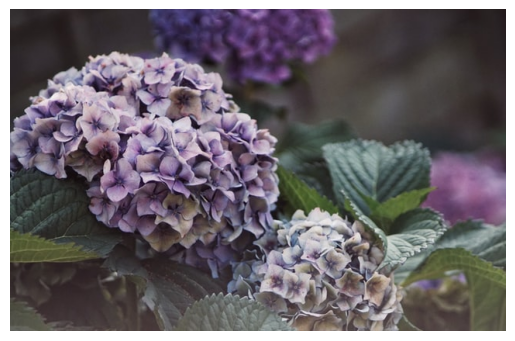


유사한 이미지 3: unsplash\-fQqwGNgIpw.jpg
거리(낮을수록 유사): 1.4052


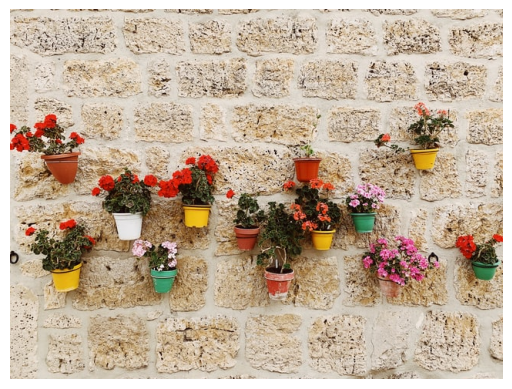


📝 텍스트 쿼리: 정원의 다채로운 꽃들

유사한 이미지 1: unsplash\-mESfCrs84c.jpg
거리(낮을수록 유사): 1.4185


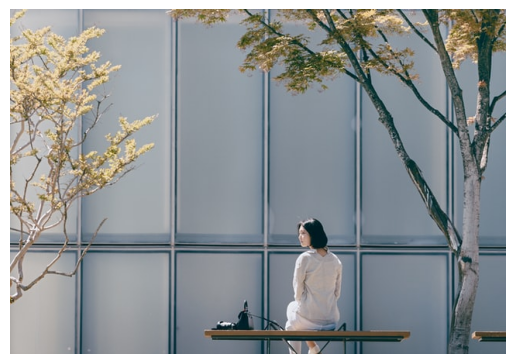


유사한 이미지 2: unsplash\-cKXtsJWU-I.jpg
거리(낮을수록 유사): 1.4210


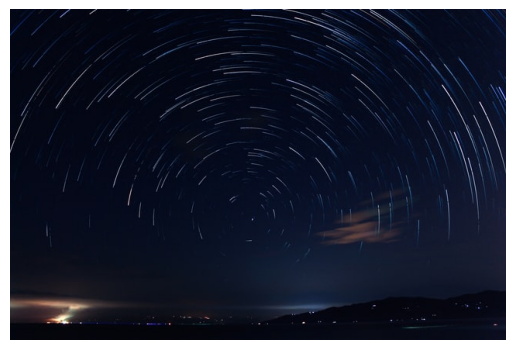


유사한 이미지 3: unsplash\1DljuMaWA9g.jpg
거리(낮을수록 유사): 1.4299


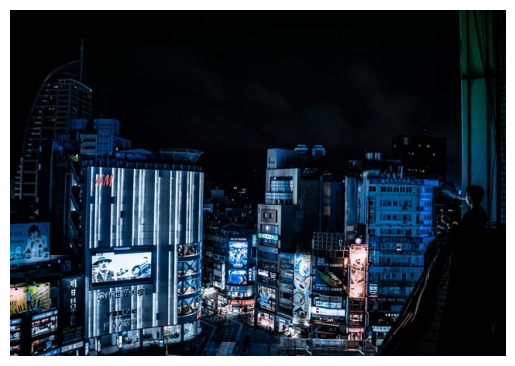


📝 텍스트 쿼리: a city skyline at night

유사한 이미지 1: unsplash\0dD8vddb6_8.jpg
거리(낮을수록 유사): 1.3419


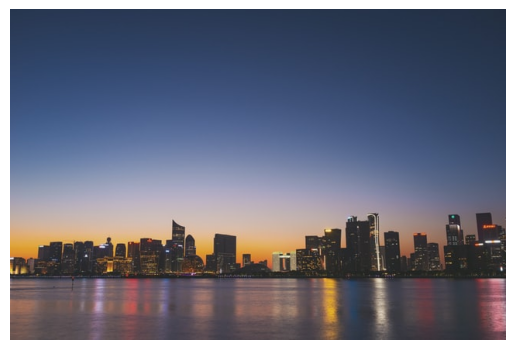


유사한 이미지 2: unsplash\1DljuMaWA9g.jpg
거리(낮을수록 유사): 1.3439


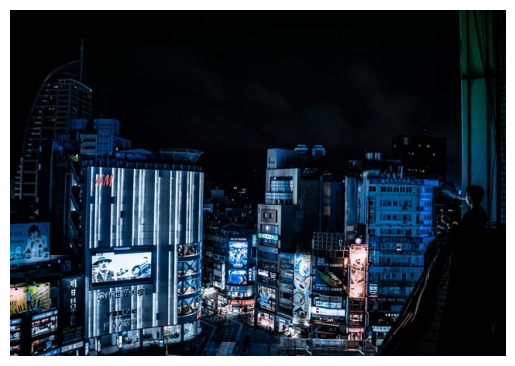


유사한 이미지 3: unsplash\-uzgaA9LfNw.jpg
거리(낮을수록 유사): 1.3645


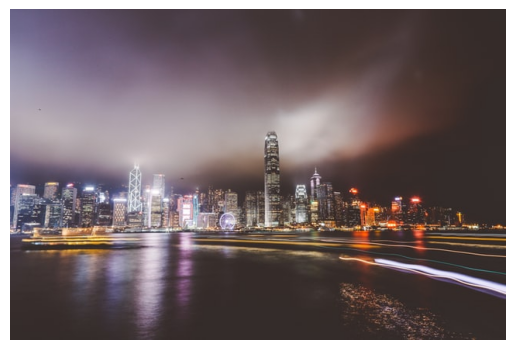


📝 텍스트 쿼리: 밤의 도시 스카이라인

유사한 이미지 1: unsplash\0DFk--9cWO4.jpg
거리(낮을수록 유사): 1.4592


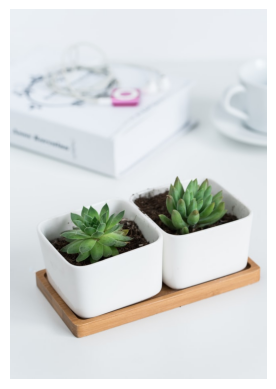


유사한 이미지 2: unsplash\0hDR599-5I0.jpg
거리(낮을수록 유사): 1.4630


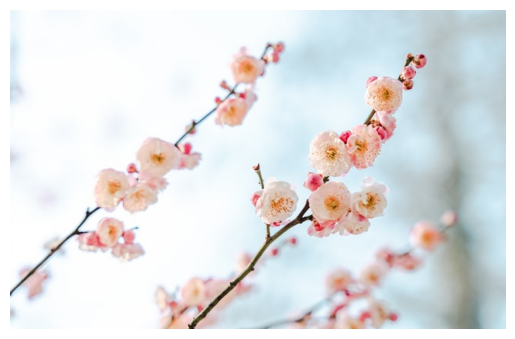


유사한 이미지 3: unsplash\-mESfCrs84c.jpg
거리(낮을수록 유사): 1.4652


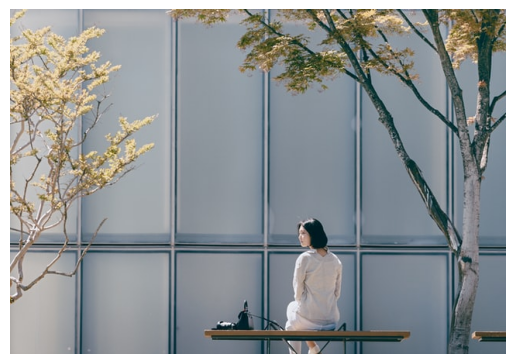


✅ 실습 완료: 다양한 텍스트 쿼리로 이미지 검색을 성공적으로 수행했습니다.

📊 결과 분석:
1. 영어와 한국어 쿼리 모두 이미지 검색이 가능합니다.
2. 거리 값이 낮을수록 텍스트와 이미지가 더 유사합니다.
3. 같은 의미의 영어/한국어 쿼리가 유사한 결과를 반환하는지 확인해보세요.
4. 구체적인 설명일수록 더 정확한 검색 결과를 얻을 수 있습니다.


In [29]:
# 여기에 코드를 작성하세요. 

# 다양한 텍스트 쿼리로 이미지 검색 수행
custom_text_queries = [
    "a beautiful sunset over the ocean",
    "바다 위의 아름다운 일몰",
    "a person riding a bicycle",
    "자전거를 타는 사람",
    "colorful flowers in a garden",
    "정원의 다채로운 꽃들",
    "a city skyline at night",
    "밤의 도시 스카이라인",
]

print("=" * 80)
print("다양한 텍스트 쿼리를 사용한 이미지 검색 실습")
print("=" * 80)

# 각 텍스트 쿼리에 대해 이미지 검색 수행
for text_query in custom_text_queries:
    print(f"\n{'=' * 80}")
    print(f"📝 텍스트 쿼리: {text_query}")
    print(f"{'=' * 80}")
    
    # 유사한 이미지 검색
    distances, indices = search_similar_images_by_text(text_query, k=3)
    
    # 유사한 이미지 출력
    for i, idx in enumerate(indices):
        print(f"\n유사한 이미지 {i+1}: {img_files[idx]}")
        print(f"거리(낮을수록 유사): {distances[i]:.4f}")
        show_image(img_files[idx])

print(f"\n{'=' * 80}")
print("✅ 실습 완료: 다양한 텍스트 쿼리로 이미지 검색을 성공적으로 수행했습니다.")
print(f"{'=' * 80}")

# 결과 분석
print("\n📊 결과 분석:")
print("1. 영어와 한국어 쿼리 모두 이미지 검색이 가능합니다.")
print("2. 거리 값이 낮을수록 텍스트와 이미지가 더 유사합니다.")
print("3. 같은 의미의 영어/한국어 쿼리가 유사한 결과를 반환하는지 확인해보세요.")
print("4. 구체적인 설명일수록 더 정확한 검색 결과를 얻을 수 있습니다.")

---
## [심화] 

- 다국어 지원하는 CLIP 모델을 사용하여, FAISS 인덱스를 생성합니다. (예: xlm-roberta-base-ViT-B-32)
    - **XLM-RoBERTa**는 Facebook AI에서 개발한 다국어 언어 모델로, 100개 언어에 대해 사전 학습
    - **ViT-B/32**는 이미지 처리용 Vision Transformer로, B는 모델 크기(Base), 32는 패치 크기를 의미
    - **OpenCLIP**에서는 XLM-RoBERTa를 텍스트 인코더로, ViT를 이미지 인코더로 조합하여 사용

- 영어, 한국어 쿼리에 대한 이미지 검색을 수행합니다. 


심화 실습: 다국어 지원 CLIP 모델 사용

1️⃣ 다국어 CLIP 모델 다운로드 중...
✅ 이미 다운로드됨: ./models/xlm_roberta_vit_b32
✅ 체크포인트 파일 찾음: ./models/xlm_roberta_vit_b32/open_clip_pytorch_model.bin

로컬 체크포인트에서 모델 로드 중: ./models/xlm_roberta_vit_b32/open_clip_pytorch_model.bin
✅ 다국어 CLIP 모델 로드 완료!

2️⃣ 다국어 모델로 이미지 임베딩 계산 중...
(1000개 이미지 처리, 시간이 걸릴 수 있습니다...)


다국어 모델 임베딩 계산: 100%|██████████| 16/16 [00:30<00:00,  1.93s/it]


✅ 다국어 이미지 임베딩 Shape: (1000, 512)

3️⃣ 다국어 FAISS 인덱스 생성 중...
✅ 다국어 FAISS 인덱스 생성 완료!

4️⃣ 다국어 이미지 검색 수행

🌍 언어: English
📝 텍스트 쿼리: a beautiful sunset over the ocean

유사한 이미지 1: unsplash\1kM1ykIvI6k.jpg
거리(낮을수록 유사): 1.6235


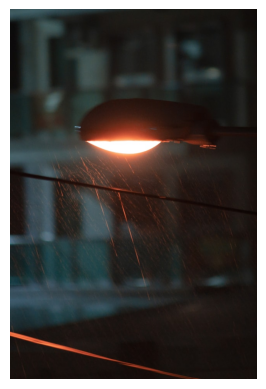


유사한 이미지 2: unsplash\0KleqkJzL1k.jpg
거리(낮을수록 유사): 1.6237


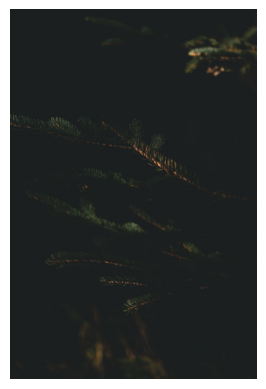


유사한 이미지 3: unsplash\1eReB1OKOr0.jpg
거리(낮을수록 유사): 1.6251


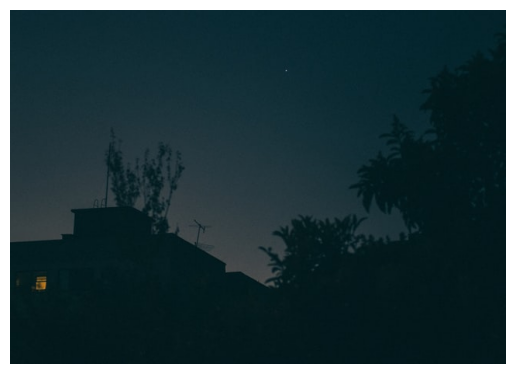


🌍 언어: 한국어
📝 텍스트 쿼리: 바다 위의 아름다운 일몰

유사한 이미지 1: unsplash\1kM1ykIvI6k.jpg
거리(낮을수록 유사): 1.5987


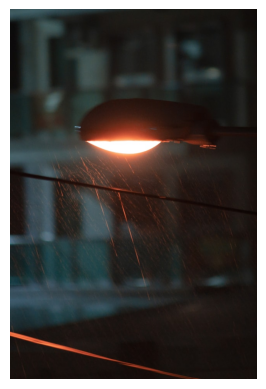


유사한 이미지 2: unsplash\16SnfLT6HAw.jpg
거리(낮을수록 유사): 1.6022


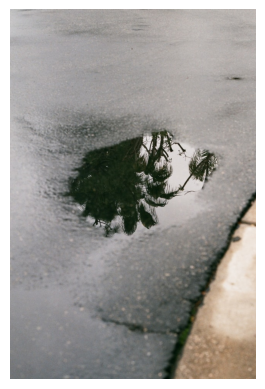


유사한 이미지 3: unsplash\0Q3m0UJlRyM.jpg
거리(낮을수록 유사): 1.6030


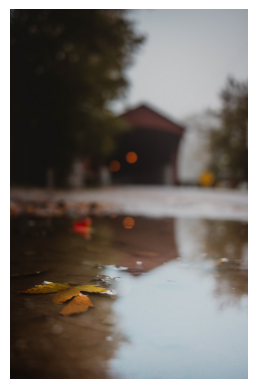


🌍 언어: English
📝 텍스트 쿼리: a person riding a bicycle in the city

유사한 이미지 1: unsplash\1eReB1OKOr0.jpg
거리(낮을수록 유사): 1.6263


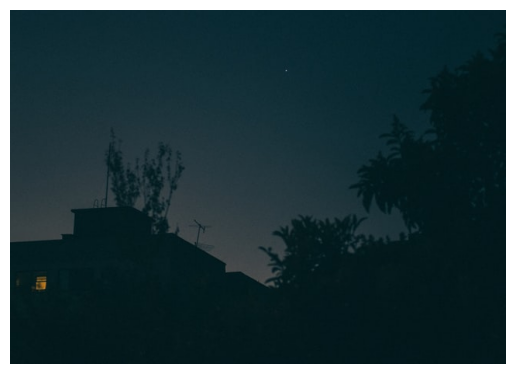


유사한 이미지 2: unsplash\0KleqkJzL1k.jpg
거리(낮을수록 유사): 1.6321


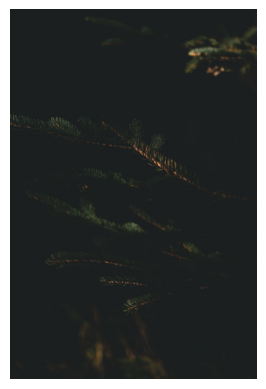


유사한 이미지 3: unsplash\0ufkmj46xvU.jpg
거리(낮을수록 유사): 1.6353


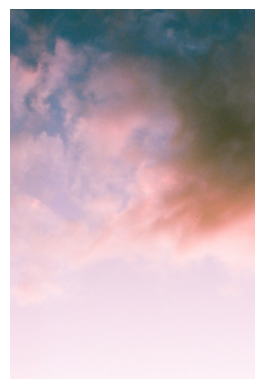


🌍 언어: 한국어
📝 텍스트 쿼리: 도시에서 자전거를 타는 사람

유사한 이미지 1: unsplash\-JLxSO9vUeY.jpg
거리(낮을수록 유사): 1.6229


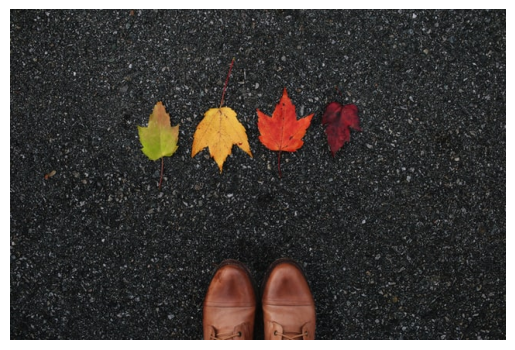


유사한 이미지 2: unsplash\-O7lmpJGjEo.jpg
거리(낮을수록 유사): 1.6287


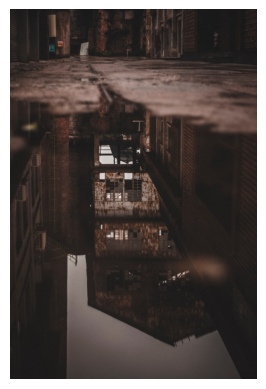


유사한 이미지 3: unsplash\0Q3m0UJlRyM.jpg
거리(낮을수록 유사): 1.6296


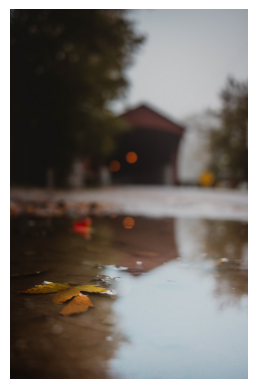


🌍 언어: English
📝 텍스트 쿼리: colorful flowers blooming in spring

유사한 이미지 1: unsplash\0KleqkJzL1k.jpg
거리(낮을수록 유사): 1.6191


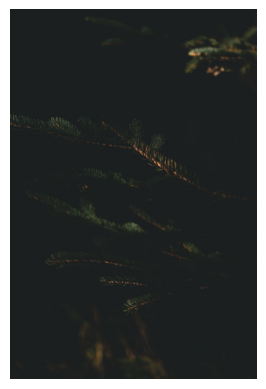


유사한 이미지 2: unsplash\1eReB1OKOr0.jpg
거리(낮을수록 유사): 1.6201


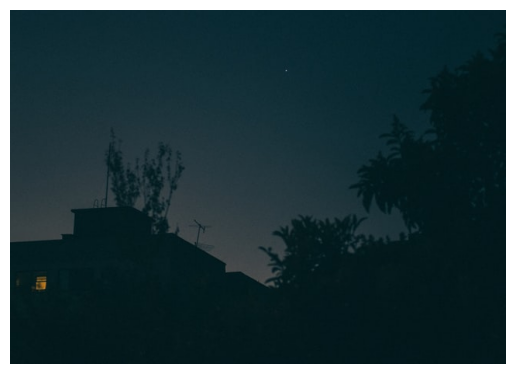


유사한 이미지 3: unsplash\-YJwv851oys.jpg
거리(낮을수록 유사): 1.6210


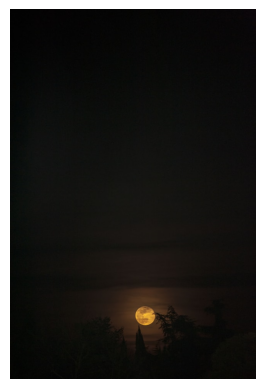


🌍 언어: 한국어
📝 텍스트 쿼리: 봄에 피어나는 다채로운 꽃들

유사한 이미지 1: unsplash\0eE9GfBaxDg.jpg
거리(낮을수록 유사): 1.6405


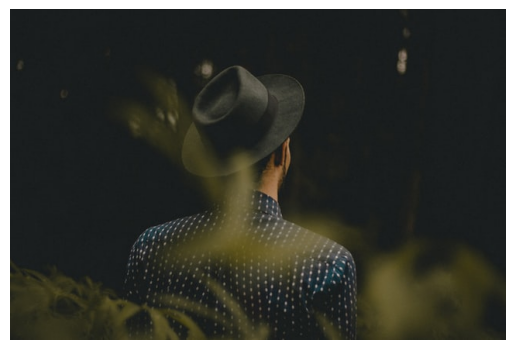


유사한 이미지 2: unsplash\-lkzSWtoK7s.jpg
거리(낮을수록 유사): 1.6409


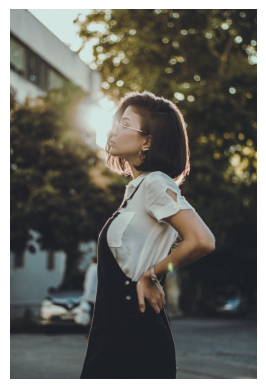


유사한 이미지 3: unsplash\0CvGF6aNkbg.jpg
거리(낮을수록 유사): 1.6489


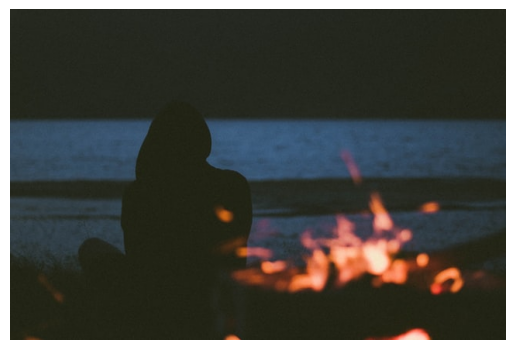


✅ 심화 실습 완료!

📊 다국어 모델 결과 분석:
1. XLM-RoBERTa 기반 모델은 100개 이상의 언어를 지원합니다.
2. 영어와 한국어 쿼리가 의미적으로 유사한 이미지를 찾는지 비교해보세요.
3. 다국어 모델은 언어 간 의미 공간을 공유하여 cross-lingual 검색이 가능합니다.
4. 같은 의미의 영어/한국어 쿼리가 유사한 검색 결과를 반환하는 것을 확인할 수 있습니다.


In [30]:
# 여기에 코드를 작성하세요.

print("=" * 80)
print("심화 실습: 다국어 지원 CLIP 모델 사용")
print("=" * 80)

# 1. 다국어 CLIP 모델 다운로드
print("\n1️⃣ 다국어 CLIP 모델 다운로드 중...")

import subprocess
import os

multilingual_model_dir = "./models/xlm_roberta_vit_b32"

# 모델 다운로드 (subprocess 사용)
if not os.path.exists(multilingual_model_dir):
    print("다국어 모델 다운로드 중... (약 5-15분 소요)")
    print("⚠️ huggingface-cli를 사용하여 다운로드합니다.")
    
    cmd = [
        "huggingface-cli",
        "download",
        "laion/CLIP-ViT-B-32-xlm-roberta-base-laion5B-s13B-b90k",
        "--local-dir", multilingual_model_dir,
        "--local-dir-use-symlinks", "False"
    ]
    
    try:
        result = subprocess.run(cmd, check=True, capture_output=True, text=True)
        print("✅ 다운로드 완료!")
        if result.stdout:
            print(result.stdout)
    except subprocess.CalledProcessError as e:
        print(f"❌ 다운로드 실패: {e}")
        print(f"stderr: {e.stderr}")
        raise
    except FileNotFoundError:
        print("❌ huggingface-cli를 찾을 수 없습니다.")
        print("   설치: pip install -U huggingface_hub")
        raise
else:
    print(f"✅ 이미 다운로드됨: {multilingual_model_dir}")

# 2. 다운로드된 체크포인트 파일 찾기
checkpoint_files = [
    f"{multilingual_model_dir}/open_clip_pytorch_model.bin",
    f"{multilingual_model_dir}/pytorch_model.bin",
    f"{multilingual_model_dir}/model.safetensors",
    f"{multilingual_model_dir}/open_clip_model.safetensors"
]

multilingual_checkpoint = None
for ckpt in checkpoint_files:
    if os.path.exists(ckpt):
        multilingual_checkpoint = ckpt
        print(f"✅ 체크포인트 파일 찾음: {ckpt}")
        break

if multilingual_checkpoint is None:
    # 디렉토리 내 .bin 또는 .safetensors 파일 검색
    print(f"📂 디렉토리 탐색 중: {multilingual_model_dir}")
    for f in os.listdir(multilingual_model_dir):
        if f.endswith('.bin') or f.endswith('.safetensors'):
            multilingual_checkpoint = os.path.join(multilingual_model_dir, f)
            print(f"✅ 체크포인트 파일 발견: {multilingual_checkpoint}")
            break

if multilingual_checkpoint is None:
    print(f"\n❌ 체크포인트 파일을 찾을 수 없습니다.")
    print(f"디렉토리 내용:")
    for f in os.listdir(multilingual_model_dir):
        print(f"  - {f}")
    print("\n해결 방법:")
    print("1. 디렉토리 삭제 후 재실행: import shutil; shutil.rmtree('./models/xlm_roberta_vit_b32')")
    print("2. 이 셀을 다시 실행하여 모델을 다운로드하세요.")
    raise FileNotFoundError(f"체크포인트 파일을 찾을 수 없습니다: {multilingual_model_dir}")

# 로컬 체크포인트에서 모델 로드
print(f"\n로컬 체크포인트에서 모델 로드 중: {multilingual_checkpoint}")
multilingual_model, _, multilingual_preprocess = open_clip.create_model_and_transforms(
    'xlm-roberta-base-ViT-B-32',
    pretrained=multilingual_checkpoint,
    device=device
)

multilingual_model.eval()
print("✅ 다국어 CLIP 모델 로드 완료!")

# 3. 다국어 모델로 이미지 임베딩 재계산
print("\n2️⃣ 다국어 모델로 이미지 임베딩 계산 중...")
print("(1000개 이미지 처리, 시간이 걸릴 수 있습니다...)")

multilingual_img_embeddings = []
batch_size = 64

for i in tqdm(range(0, len(img_files), batch_size), desc='다국어 모델 임베딩 계산'):
    batch_files = img_files[i:i+batch_size]
    
    # 배치 이미지 로드 및 전처리
    batch_images = []
    for img_path in batch_files:
        try:
            img = Image.open(img_path).convert('RGB')
            batch_images.append(multilingual_preprocess(img))
        except Exception as e:
            continue
    
    if len(batch_images) == 0:
        continue
    
    # 배치 텐서로 변환 및 GPU로 이동
    batch_tensor = torch.stack(batch_images).to(device)
    
    # 임베딩 계산
    with torch.no_grad(), torch.cuda.amp.autocast():
        image_features = multilingual_model.encode_image(batch_tensor)
        # 정규화
        image_features = image_features / image_features.norm(dim=-1, keepdim=True)
    
    # NumPy로 변환하여 저장
    batch_embeddings = image_features.cpu().numpy()
    multilingual_img_embeddings.append(batch_embeddings)

# NumPy 배열로 변환
multilingual_img_embeddings = np.vstack(multilingual_img_embeddings)
print(f"✅ 다국어 이미지 임베딩 Shape: {multilingual_img_embeddings.shape}")

# 4. 다국어 FAISS 인덱스 생성
print("\n3️⃣ 다국어 FAISS 인덱스 생성 중...")
multilingual_index = faiss.IndexFlatL2(multilingual_img_embeddings.shape[1])
multilingual_index.add(multilingual_img_embeddings)
faiss.write_index(multilingual_index, 'multilingual_img_embeddings.index')
print("✅ 다국어 FAISS 인덱스 생성 완료!")

# 5. 다국어 이미지 검색 함수 정의
def search_multilingual_images(text_query, k):
    """다국어 모델을 사용한 이미지 검색"""
    # 텍스트 토큰화
    text_tokens = open_clip.tokenize([text_query]).to(device)
    
    # 텍스트 임베딩 생성
    with torch.no_grad(), torch.cuda.amp.autocast():
        text_embedding = multilingual_model.encode_text(text_tokens)
        # 정규화
        text_embedding = text_embedding / text_embedding.norm(dim=-1, keepdim=True)
    
    # NumPy 배열로 변환
    text_embedding = text_embedding.cpu().numpy().astype(np.float32)
    
    # FAISS 인덱스에서 검색
    distances, indices = multilingual_index.search(text_embedding, k)
    
    return distances[0], indices[0]

# 6. 다양한 언어로 이미지 검색 수행
print("\n4️⃣ 다국어 이미지 검색 수행")
print("=" * 80)

multilingual_queries = [
    ("English", "a beautiful sunset over the ocean"),
    ("한국어", "바다 위의 아름다운 일몰"),
    ("English", "a person riding a bicycle in the city"),
    ("한국어", "도시에서 자전거를 타는 사람"),
    ("English", "colorful flowers blooming in spring"),
    ("한국어", "봄에 피어나는 다채로운 꽃들"),
]

for language, text_query in multilingual_queries:
    print(f"\n{'=' * 80}")
    print(f"🌍 언어: {language}")
    print(f"📝 텍스트 쿼리: {text_query}")
    print(f"{'=' * 80}")
    
    # 유사한 이미지 검색
    distances, indices = search_multilingual_images(text_query, k=3)
    
    # 유사한 이미지 출력
    for i, idx in enumerate(indices):
        print(f"\n유사한 이미지 {i+1}: {img_files[idx]}")
        print(f"거리(낮을수록 유사): {distances[i]:.4f}")
        show_image(img_files[idx])

print(f"\n{'=' * 80}")
print("✅ 심화 실습 완료!")
print("=" * 80)

# 결과 분석
print("\n📊 다국어 모델 결과 분석:")
print("1. XLM-RoBERTa 기반 모델은 100개 이상의 언어를 지원합니다.")
print("2. 영어와 한국어 쿼리가 의미적으로 유사한 이미지를 찾는지 비교해보세요.")
print("3. 다국어 모델은 언어 간 의미 공간을 공유하여 cross-lingual 검색이 가능합니다.")
print("4. 같은 의미의 영어/한국어 쿼리가 유사한 검색 결과를 반환하는 것을 확인할 수 있습니다.")